# [Howsam](https://howsam.org) Artificial Intelligence Academy

### Faster RCNN with PyTorch Webinar



In [3]:
import torch
import torchvision

In [5]:
print(torch.cuda.get_device_properties(0))

device = 'cuda' if torch.cuda.is_available() else 'cpu'

_CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15079MB, multi_processor_count=40)


# Warmup

In [6]:
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
model.to(device)

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256)
          (relu): ReLU(inplace=True)
          (downsample)

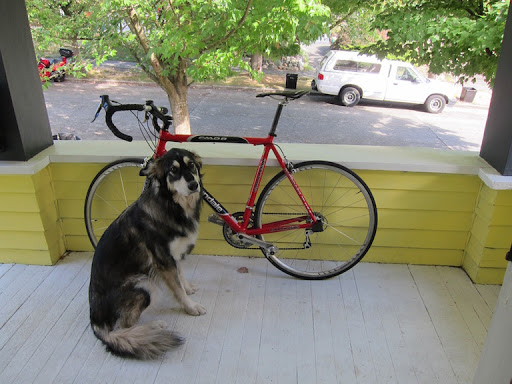

In [8]:
from PIL import Image

img_pil = Image.open('obj-det-test.jpg').convert('RGB')
display(img_pil)

## Eval

In [9]:
tensor = torchvision.transforms.functional.to_tensor(img_pil)
list_img = [tensor.to(device)]

model.eval()
with torch.no_grad():
  predictions = model(list_img)

predictions

/usr/local/lib/python3.6/dist-packages/torchvision/ops/boxes.py:101: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:766.)
  keep = keep.nonzero().squeeze(1)


[{'boxes': tensor([[ 86.7726, 150.9067, 211.5249, 356.7393],
          [111.6696,  77.0234, 379.2987, 293.9193],
          [ 84.7788,  90.0316, 187.7287, 257.6764],
          [312.7295,  52.2461, 455.4553, 112.3717],
          [314.6144,  54.6717, 457.0245, 112.3877],
          [ 83.9576,  74.3794, 275.9912, 266.2186],
          [475.3144,  15.1999, 507.3330, 167.7789],
          [ 84.2759, 155.8032, 147.4809, 252.5171],
          [476.9505,  12.9353, 511.8382, 181.5269],
          [ 39.0867,  56.6382,  67.0213,  82.3778],
          [451.4601,  60.7754, 478.6562, 103.7835],
          [ 80.7140,  88.7107, 341.3815, 272.8965],
          [ 36.9921,  57.0862,  65.7687,  84.0576],
          [ 71.9506, 109.6713, 254.5916, 247.4116],
          [ 88.9964, 140.8144, 212.4193, 358.0804],
          [454.2299,  23.2714, 496.6578, 116.2059],
          [ 58.3581,  47.6459,  75.1983,  57.9588],
          [ 38.0441,  55.5769,  67.2753,  81.8821],
          [ 58.6550,  47.6555,  74.0770,  57.8598],
   

In [10]:
tensor.shape

torch.Size([3, 384, 512])

In [11]:
boxes = predictions[0]['boxes']
labels = predictions[0]['labels']
scores = predictions[0]['scores']

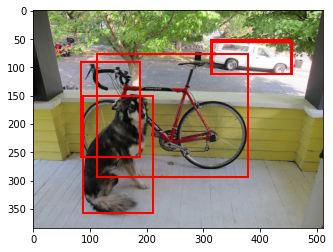

In [12]:
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

np_arr = tensor.permute(1, 2, 0).numpy()
plt.imshow(np_arr)

ax = plt.gca()
for box, label, score in zip(boxes, labels, scores):
  if score > 0.6:
    rect = Rectangle((box[0], box[1]),
                     (box[2] - box[0]),
                     (box[3] - box[1]),
                     fill=False,
                     edgecolor=(1, 0, 0),
                     linewidth=2)
    ax.add_patch(rect)

plt.show()

## Train

In [14]:
targets = []
target = {}
target['boxes'] = boxes
target['labels'] = labels
targets.append(target)
# print(targets[0])

model.train()
model(list_img, targets)

{'loss_box_reg': tensor(0.3428, device='cuda:0', grad_fn=<DivBackward0>),
 'loss_classifier': tensor(0.6168, device='cuda:0', grad_fn=<NllLossBackward>),
 'loss_objectness': tensor(0.1099, device='cuda:0', grad_fn=<BinaryCrossEntropyWithLogitsBackward>),
 'loss_rpn_box_reg': tensor(0.0445, device='cuda:0', grad_fn=<DivBackward0>)}

# Level 3

## Step 1

In [15]:
!git clone https://github.com/experiencor/raccoon_dataset

Cloning into 'raccoon_dataset'...
remote: Enumerating objects: 646, done.
remote: Total 646 (delta 0), reused 0 (delta 0), pack-reused 646
Receiving objects: 100% (646/646), 48.00 MiB | 40.03 MiB/s, done.
Resolving deltas: 100% (412/412), done.


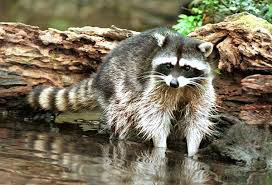

array([[308,  90, 611, 426],
       [103,   1, 314, 189]])

In [16]:
import os
import pandas as pd

root = './raccoon_dataset'
phase = 'test'

imgs = os.listdir(os.path.join(root, 'images'))
targets = pd.read_csv(os.path.join(root, 'data/{}_labels.csv'.format(phase)))

idx = 10
img_path = os.path.join(root, 'images', imgs[idx])
img = Image.open(img_path).convert('RGB')
display(img)

box_list = targets[targets['filename'] == 'raccoon-176.jpg']
box_list[['xmin', 'ymin', 'xmax', 'ymax']].values

In [39]:
from torchvision.transforms import functional as F

class RaccoonDataset(torch.utils.data.Dataset):
  def __init__(self, root, phase):
    self.root = root
    self.phase = phase

    # self.imgs = os.listdir(os.path.join(root, 'images'))
    self.targets = pd.read_csv(os.path.join(root, 'data/{}_labels.csv'.format(phase)))
    self.imgs = self.targets['filename']

  def __getitem__(self, idx):
    img_path = os.path.join(self.root, 'images', self.imgs[idx])
    img = Image.open(img_path).convert('RGB')
    img = F.to_tensor(img)
    
    #
    box_list = self.targets[self.targets['filename'] == self.imgs[idx]]
    box_list = box_list[['xmin', 'ymin', 'xmax', 'ymax']].values
    boxes = torch.tensor(box_list, dtype=torch.float32)
    #
    labels = torch.ones((len(box_list), ), dtype=torch.int64)
    #
    target = {}
    target['boxes'] = boxes
    target['labels'] = labels
    #
    return img, target

  def __len__(self):
    return len(self.imgs)

In [35]:
train_dataset = RaccoonDataset('./raccoon_dataset/', 'train')
test_dataset = RaccoonDataset('./raccoon_dataset/', 'test')

In [19]:
train_dataset.__getitem__(10)

(tensor([[[0.7294, 0.7294, 0.7255,  ..., 0.4431, 0.4353, 0.4235],
          [0.7294, 0.7294, 0.7255,  ..., 0.4353, 0.4314, 0.4431],
          [0.7294, 0.7294, 0.7255,  ..., 0.4863, 0.4824, 0.4784],
          ...,
          [0.2980, 0.3333, 0.4314,  ..., 0.4353, 0.4588, 0.4588],
          [0.3490, 0.3412, 0.3294,  ..., 0.4118, 0.4275, 0.4235],
          [0.3569, 0.3412, 0.3686,  ..., 0.4157, 0.4275, 0.4275]],
 
         [[0.6314, 0.6314, 0.6314,  ..., 0.3529, 0.3412, 0.3294],
          [0.6314, 0.6314, 0.6314,  ..., 0.3412, 0.3373, 0.3490],
          [0.6314, 0.6314, 0.6314,  ..., 0.3922, 0.3882, 0.3843],
          ...,
          [0.2706, 0.3059, 0.4039,  ..., 0.3098, 0.3333, 0.3333],
          [0.3216, 0.3137, 0.3020,  ..., 0.2863, 0.3020, 0.2980],
          [0.3216, 0.3059, 0.3333,  ..., 0.2902, 0.3020, 0.3020]],
 
         [[0.4745, 0.4745, 0.4588,  ..., 0.2980, 0.2941, 0.2824],
          [0.4745, 0.4706, 0.4588,  ..., 0.2941, 0.2902, 0.3020],
          [0.4706, 0.4706, 0.4588,  ...,

In [36]:
def new_concat(batch):
  return tuple(zip(*batch))

In [37]:
train_loader = torch.utils.data.DataLoader(train_dataset,
                            batch_size=2,
                            shuffle=True,
                            collate_fn=new_concat)

test_loader = torch.utils.data.DataLoader(test_dataset,
                            batch_size=1,
                            shuffle=True,
                            collate_fn=new_concat)

In [38]:
next(iter(test_loader))

((tensor([[[0.5725, 0.5725, 0.5725,  ..., 0.2275, 0.2431, 0.0824],
           [0.5765, 0.5725, 0.5725,  ..., 0.1961, 0.2510, 0.1686],
           [0.5804, 0.5765, 0.5765,  ..., 0.1647, 0.2118, 0.2118],
           ...,
           [0.4118, 0.4196, 0.4235,  ..., 0.3765, 0.3804, 0.3765],
           [0.4196, 0.4275, 0.4275,  ..., 0.3961, 0.4039, 0.3961],
           [0.4196, 0.4157, 0.4039,  ..., 0.4000, 0.4196, 0.4235]],
  
          [[0.6078, 0.6078, 0.6078,  ..., 0.2353, 0.2510, 0.0902],
           [0.6118, 0.6078, 0.6078,  ..., 0.2039, 0.2588, 0.1765],
           [0.6157, 0.6118, 0.6118,  ..., 0.1647, 0.2118, 0.2118],
           ...,
           [0.4902, 0.4980, 0.5020,  ..., 0.4000, 0.4039, 0.4000],
           [0.4980, 0.5059, 0.5059,  ..., 0.4196, 0.4275, 0.4196],
           [0.4980, 0.4941, 0.4824,  ..., 0.4235, 0.4431, 0.4471]],
  
          [[0.6039, 0.6039, 0.6039,  ..., 0.1922, 0.2078, 0.0471],
           [0.6078, 0.6039, 0.6039,  ..., 0.1608, 0.2157, 0.1333],
           [0.6118, 0.

## Step 2

In [23]:
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(1024, 2)
model.to(device)

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256)
          (relu): ReLU(inplace=True)
          (downsample)

## Step 3

In [24]:
optimizer = torch.optim.SGD(model.parameters(), lr=0.005,
                            momentum=0.9, weight_decay=0.0005)

lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                               step_size=3,
                                               gamma=0.1)

## Step 4

In [25]:
import math
def train_one_epoch(model, optimizer, train_dataloader):
    model.train()
    total_loss = 0
    for images, targets in train_dataloader:
        images = [image.to(device) for image in images]
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())
        total_loss += losses
        optimizer.zero_grad()
        losses.backward()
        optimizer.step()
    return total_loss/len(train_dataloader)

In [27]:
num_epochs = 10

for epoch in range(num_epochs):
    loss = train_one_epoch(model, optimizer, train_loader)
    print('epoch [{}]:  \t lr: {}  \t loss: {}  '.format(epoch, lr_scheduler.get_last_lr(), loss))
    lr_scheduler.step()

epoch [0]:  	 lr: [0.005]  	 loss: 0.18680217862129211  
epoch [1]:  	 lr: [0.005]  	 loss: 0.09596266597509384  
epoch [2]:  	 lr: [0.005]  	 loss: 0.07801435887813568  
epoch [3]:  	 lr: [0.0005]  	 loss: 0.05853167921304703  
epoch [4]:  	 lr: [0.0005]  	 loss: 0.05006614327430725  
epoch [5]:  	 lr: [0.0005]  	 loss: 0.04695529490709305  
epoch [6]:  	 lr: [5e-05]  	 loss: 0.044373102486133575  
epoch [7]:  	 lr: [5e-05]  	 loss: 0.04418860748410225  
epoch [8]:  	 lr: [5e-05]  	 loss: 0.044201046228408813  
epoch [9]:  	 lr: [5e-06]  	 loss: 0.043362829834222794  


## Step 6

In [28]:
! mkdir /content/output_images

In [29]:
import matplotlib.patches as patches

def evaluate(model, test_dataloader):
    model.eval()
    with torch.no_grad():
        cnt = 0
        for images , targets in test_dataloader:
            images = list(image.to(device) for image in images)
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
            out = model(images)
            scores = out[0]['scores'].cpu().numpy()
            inds = scores > 0.7
            bxs = out[0]['boxes'].cpu().numpy()
            bxs = bxs[inds]
            gt = targets[0]['boxes'].cpu().numpy()
            # gt = gt[0]
            img = images[0].permute(1, 2, 0).cpu().numpy()
            #----------------------------------------------------------
            fig, ax = plt.subplots(1)
            ax.imshow(img)
            for j in range(len(gt)):
                rect1 = patches.Rectangle((int(gt[j][0]),int(gt[j][1])),abs(gt[j][0]-gt[j][2]),
                                abs(gt[j][1]-gt[j][3]),linewidth=3,edgecolor='g',facecolor='none')
                ax.add_patch(rect1)
            for i in range(len(bxs)):
                rect = patches.Rectangle((int(bxs[i][0]),int(bxs[i][1])),abs(bxs[i][0]-bxs[i][2]),
                                         abs(bxs[i][1]-bxs[i][3]),linewidth=3,edgecolor='r',facecolor='none')
                ax.add_patch(rect)
            fig.savefig("/content/output_images/{}.png".format(cnt), dpi=90, bbox_inches='tight')
            cnt = cnt + 1

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


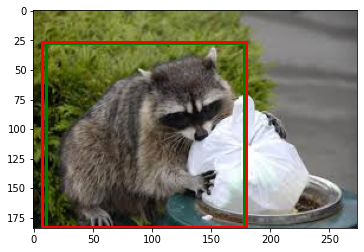

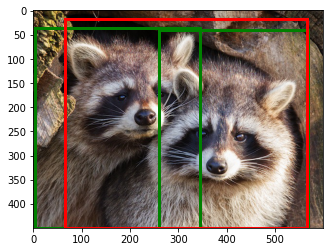

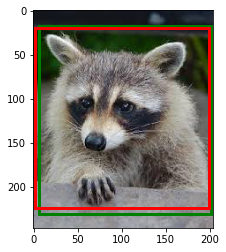

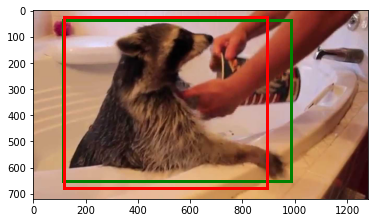

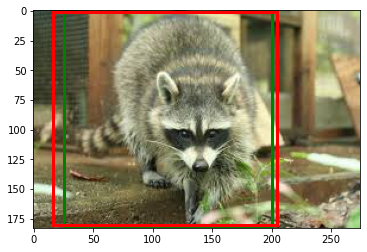

...

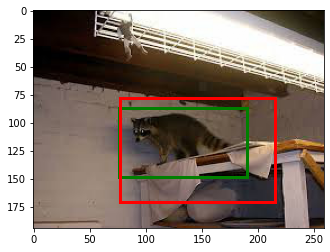

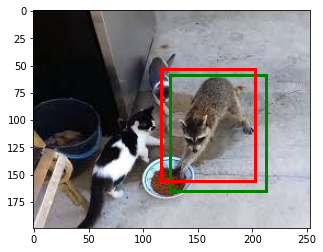

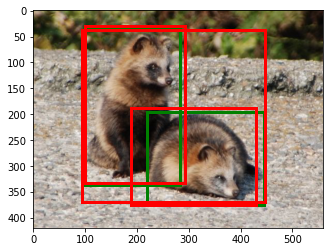

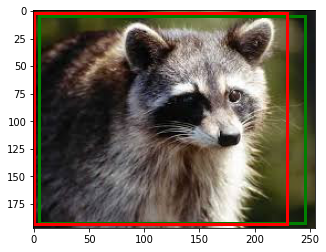

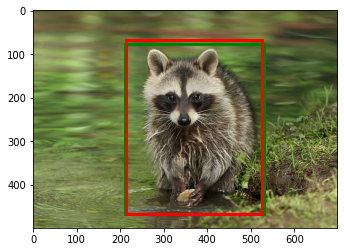

In [26]:
evaluate(model, test_loader)

# Level 2

In [30]:
backbone = torchvision.models.mobilenet_v2(pretrained=True).features
backbone.out_channels = 1280
light_model = torchvision.models.detection.FasterRCNN(backbone=backbone, num_classes=2)
light_model.to(device)

Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): Sequential(
    (0): ConvBNReLU(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU6(inplace=True)
    )
    (1): InvertedResidual(
      (conv): Sequential(
        (0): ConvBNReLU(
          (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
          (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU6(inplace=True)
        )
        (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
    )
    (2): InvertedResidual(
      (conv): Se

In [31]:
optimizer = torch.optim.SGD(light_model.parameters(), lr=0.05,
                            momentum=0.9, weight_decay=0.0005)

lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                               step_size=2,
                                               gamma=0.9)

In [32]:
num_epochs = 50

for epoch in range(num_epochs):
    loss = train_one_epoch(light_model, optimizer, train_loader)
    print('epoch [{}]:  \t lr: {}  \t loss: {}  '.format(epoch, lr_scheduler.get_last_lr(), loss))
    lr_scheduler.step()

epoch [0]:  	 lr: [0.05]  	 loss: 7.836902141571045  
epoch [1]:  	 lr: [0.05]  	 loss: 5.066836833953857  
epoch [2]:  	 lr: [0.045000000000000005]  	 loss: 4.971386909484863  
epoch [3]:  	 lr: [0.045000000000000005]  	 loss: 4.927382469177246  
epoch [4]:  	 lr: [0.04050000000000001]  	 loss: 4.832638263702393  
epoch [5]:  	 lr: [0.04050000000000001]  	 loss: 4.802402019500732  
epoch [6]:  	 lr: [0.03645000000000001]  	 loss: 4.801436424255371  
epoch [7]:  	 lr: [0.03645000000000001]  	 loss: 4.704100608825684  
epoch [8]:  	 lr: [0.03280500000000001]  	 loss: 4.507092475891113  
epoch [9]:  	 lr: [0.03280500000000001]  	 loss: 4.406169891357422  
epoch [10]:  	 lr: [0.02952450000000001]  	 loss: 4.295259475708008  
epoch [11]:  	 lr: [0.02952450000000001]  	 loss: 4.360695838928223  
epoch [12]:  	 lr: [0.02657205000000001]  	 loss: 4.236642360687256  
epoch [13]:  	 lr: [0.02657205000000001]  	 loss: 4.2079339027404785  
epoch [14]:  	 lr: [0.02391484500000001]  	 loss: 4.15964

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


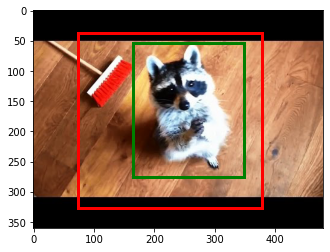

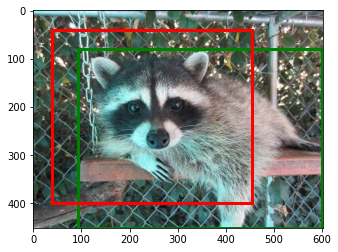

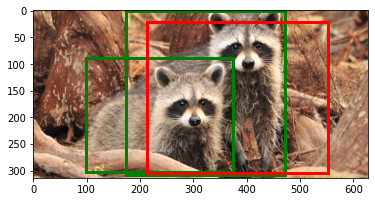

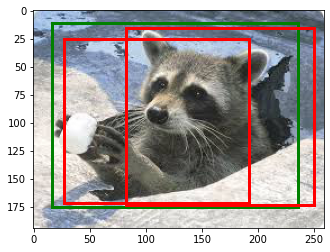

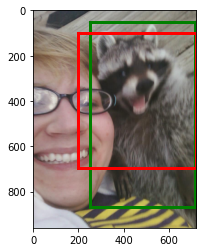

...

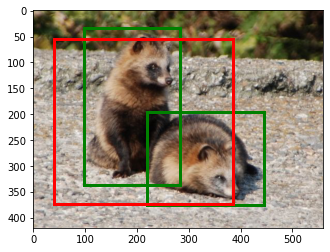

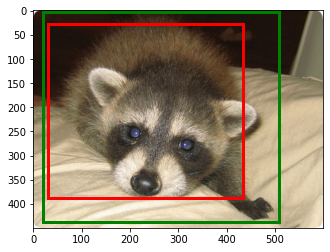

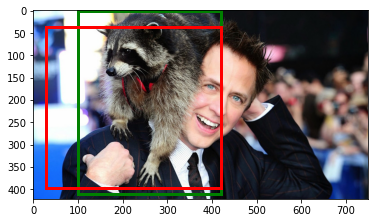

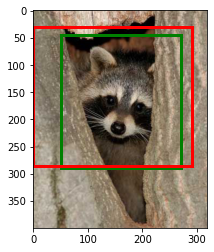

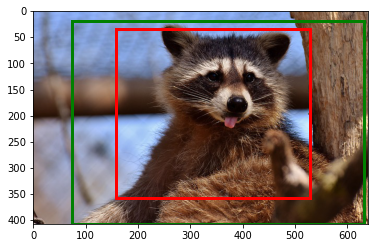

In [33]:
evaluate(light_model, test_loader)

In [ ]:
backbone = torchvision.models.mobilenet_v2(pretrained=True).features
backbone.out_channels = 1280

anchor_gen = torchvision.models.detection.rpn.AnchorGenerator(sizes=((32, 64, 128, 256, 512),),
                                                 aspect_ratios=((0.5, 1.0, 2.0), ))

# torchvision.models.detection.roi_heads.

light_model = torchvision.models.detection.FasterRCNN(backbone=backbone, num_classes=2,
                                                      rpn_anchor_generator=anchor_gen, )
light_model.train()
light_model.to(device)

In [ ]:
32*32, 64*64, 128*128, ...
32*16, 64*32, ...
32*64, 64*128, ...